In [1]:
import matplotlib.pyplot as plt
import numpy as np

##################################################
# specify number of chips you are using for data
TotalChips = int(100)
# Number of Cryocycles
TotalCryo = [0,5,20,100]
##################################################

# Subrun 0 included, so this is Last Subrun Number + 1
TotalSubruns = int(30)
'''Array format:    array[Cryocycle][chip][channel]'''

chips = []
for i in range(TotalChips):
    a = 'chip' + str(i+20)
    chips.append(a)
data = []; txt = []
for c in range(len(TotalCryo)):
    data.append([]); txt.append([])
for i in range(TotalChips):
    e = 'DataRT0' + '_' + str(chips[i])
    data[0].append(e)
    f = str(chips[i]) + 'RT0Lin.dat'
    txt[0].append(f)
for i in range(TotalChips):
    g = 'DataRT5' + '_' + str(chips[i])
    data[1].append(g)
    h = str(chips[i]) + 'RT5Lin.dat'
    txt[1].append(h)
for i in range(TotalChips):
    k = 'DataRT20' + '_' + str(chips[i])
    data[2].append(k)
    l = str(chips[i]) + 'RT20Lin.dat'
    txt[2].append(l)
for i in range(TotalChips):
    k = 'DataRT100' + '_' + str(chips[i])
    data[3].append(k)
    l = str(chips[i]) + 'RT100Lin.dat'
    txt[3].append(l)
    
channels = 16

PA = []; Ch = []; SR = []
for c in range(len(TotalCryo)):
    PA.append([]); Ch.append([]); SR.append([])
for c in range(len(TotalCryo)):
    for i in range(TotalChips):
        PA[c].append([]); Ch[c].append([]); SR[c].append([])
for c in range(len(TotalCryo)):
    for i in range(TotalChips):
        for j in range(channels):
            PA[c][i].append([]); Ch[c][i].append([]); SR[c][i].append([])
for c in range(len(TotalCryo)):
    for i in range(TotalChips):
        for j in range(channels):
            for k in range(TotalSubruns):
                Ch[c][i][j].append(j)

for c in range(len(TotalCryo)):
    for i in range(TotalChips):
        r = np.loadtxt(str(txt[c][i]),dtype=float,delimiter=None)
        rr = r.T[0]
        p = np.loadtxt(str(txt[c][i]),dtype=float,delimiter=None)
        pulseamp = p.T[2]
        for j in range(channels):
            for k in range(TotalSubruns):
                PA[c][i][j].append(pulseamp[j+k*16])
                SR[c][i][j].append(rr[j+k*16])

print('done')

done


In [2]:
# Take Maximum Pulse Amplitudes for each Subrun (from 0-30) and fit
# a linear profile. Also compute linear least squares coefficient value
# (linear coeff on an a[0] + a[1]*x (mx+b) equation)
# For the algorithm, see notes from PHYS 551 on Linear Least Squares
# (both lecture material and one of the HW's)

def LinearityFitter(Subrun,Pulse,chipindex,cryo):
    x = np.array(Subrun)
    T = np.array(Pulse)
    sigma = np.ones(x.size)*50

    S = np.sum(1./sigma**2.)
    Sx = np.sum(x/sigma**2.)
    Sy = np.sum(T/sigma**2.)
    Sxx = np.sum(x**2./sigma**2.)
    Sxy = np.sum(x*T/sigma**2.)

    A = np.array([[S,Sx],[Sx,Sxx]])
    b = np.array([Sy,Sxy])

    a = np.linalg.solve(A,b)
    fit = a[0]+a[1]*x

    #linear_coeff.append(a[1])
    LCoeff[cryo][chipindex].append(a[1])
    
    chisq = np.sum((T-fit)**2./sigma**2.)
    nf = x.size-a.size
    chi_red = chisq/nf
    
    #chi2.append((chi_red))
    
    return

LCoeff = []
for c in range(len(TotalCryo)):
    LCoeff.append([])
for c in range(len(TotalCryo)):
    for i in range(len(chips)):
        LCoeff[c].append([])
for c in range(len(TotalCryo)):
    for i in range(len(chips)):
        for j in range(channels):
            Subrun = SR[c][i][j]
            Pulse = PA[c][i][j]
            chipindex = i
            cryo = c
            LinearityFitter(Subrun,Pulse,chipindex,cryo)

print('done')

done


### Individual Linearity Plots

In [3]:
import matplotlib as mpl
import matplotlib.gridspec as grid_spec
import matplotlib.lines as mlines

def LinearityPlot16(Title,CI,path,path_cache):
    
    gs = (grid_spec.GridSpec(4,4))
    fig = plt.figure(figsize=(16,12))
    a = fig.add_subplot(gs[0:1,0]); a1 = fig.add_subplot(gs[1:2,0]); a2 = fig.add_subplot(gs[2:3,0])
    a3 = fig.add_subplot(gs[3:,0])
    a4 = fig.add_subplot(gs[0:1,1]); a5 = fig.add_subplot(gs[1:2,1]); a6 = fig.add_subplot(gs[2:3,1])
    a7 = fig.add_subplot(gs[3:,1])
    a8 = fig.add_subplot(gs[0:1,2]); a9 = fig.add_subplot(gs[1:2,2]); a10 = fig.add_subplot(gs[2:3,2])
    a11 = fig.add_subplot(gs[3:,2])
    a12 = fig.add_subplot(gs[0:1,3]); a13 = fig.add_subplot(gs[1:2,3]); a14 = fig.add_subplot(gs[2:3,3])
    a15 = fig.add_subplot(gs[3:,3])
    
    color0 = 'green'
    color5 = 'blue'
    color20 = 'red'
    color100 = 'black'
    
    # RT[0]
    a.scatter(SR[0][CI][0], PA[0][CI][0], color = color0, s=6)
    a.plot(SR[0][CI][0], PA[0][CI][0], color = color0)
    a1.scatter(SR[0][CI][1], PA[0][CI][1], color = color0, s=6)
    a1.plot(SR[0][CI][1], PA[0][CI][1], color = color0)
    a2.scatter(SR[0][CI][2], PA[0][CI][2], color = color0, s=6)
    a2.plot(SR[0][CI][2], PA[0][CI][2], color = color0)
    a3.scatter(SR[0][CI][3], PA[0][CI][3], color = color0, s=6)
    a3.plot(SR[0][CI][3], PA[0][CI][3], color = color0)
    a4.scatter(SR[0][CI][4], PA[0][CI][4], color = color0, s=6)
    a4.plot(SR[0][CI][4], PA[0][CI][4], color = color0)
    a5.scatter(SR[0][CI][5], PA[0][CI][5], color = color0, s=6)
    a5.plot(SR[0][CI][5], PA[0][CI][5], color = color0)
    a6.scatter(SR[0][CI][6], PA[0][CI][6], color = color0, s=6)
    a6.plot(SR[0][CI][6], PA[0][CI][6], color = color0)
    a7.scatter(SR[0][CI][7], PA[0][CI][7], color = color0, s=6)
    a7.plot(SR[0][CI][7], PA[0][CI][7], color = color0)
    a8.scatter(SR[0][CI][8], PA[0][CI][8], color = color0, s=6)
    a8.plot(SR[0][CI][8], PA[0][CI][8], color = color0)
    a9.scatter(SR[0][CI][9], PA[0][CI][9], color = color0, s=6)
    a9.plot(SR[0][CI][9], PA[0][CI][9], color = color0)
    a10.scatter(SR[0][CI][10], PA[0][CI][10], color = color0, s=6)
    a10.plot(SR[0][CI][10], PA[0][CI][10], color = color0)
    a11.scatter(SR[0][CI][11], PA[0][CI][11], color = color0, s=6)
    a11.plot(SR[0][CI][11], PA[0][CI][11], color = color0)
    a12.scatter(SR[0][CI][12], PA[0][CI][12], color = color0, s=6)
    a12.plot(SR[0][CI][12], PA[0][CI][12], color = color0)
    a13.scatter(SR[0][CI][13], PA[0][CI][13], color = color0, s=6)
    a13.plot(SR[0][CI][13], PA[0][CI][13], color = color0)
    a14.scatter(SR[0][CI][14], PA[0][CI][14], color = color0, s=6)
    a14.plot(SR[0][CI][14], PA[0][CI][14], color = color0)
    a15.scatter(SR[0][CI][15], PA[0][CI][15], color = color0, s=6)
    a15.plot(SR[0][CI][15], PA[0][CI][15], color = color0)
    
    # RT[5]
    a.scatter(SR[1][CI][0], PA[1][CI][0], color = color5, s=6)
    a.plot(SR[1][CI][0], PA[1][CI][0], color = color5)
    a1.scatter(SR[1][CI][1], PA[1][CI][1], color = color5, s=6)
    a1.plot(SR[1][CI][1], PA[1][CI][1], color = color5)
    a2.scatter(SR[1][CI][2], PA[1][CI][2], color = color5, s=6)
    a2.plot(SR[1][CI][2], PA[1][CI][2], color = color5)
    a3.scatter(SR[1][CI][3], PA[1][CI][3], color = color5, s=6)
    a3.plot(SR[1][CI][3], PA[1][CI][3], color = color5)
    a4.scatter(SR[1][CI][4], PA[1][CI][4], color = color5, s=6)
    a4.plot(SR[1][CI][4], PA[1][CI][4], color = color5)
    a5.scatter(SR[1][CI][5], PA[1][CI][5], color = color5, s=6)
    a5.plot(SR[1][CI][5], PA[1][CI][5], color = color5)
    a6.scatter(SR[1][CI][6], PA[1][CI][6], color = color5, s=6)
    a6.plot(SR[1][CI][6], PA[1][CI][6], color = color5)
    a7.scatter(SR[1][CI][7], PA[1][CI][7], color = color5, s=6)
    a7.plot(SR[1][CI][7], PA[1][CI][7], color = color5)
    a8.scatter(SR[1][CI][8], PA[1][CI][8], color = color5, s=6)
    a8.plot(SR[1][CI][8], PA[1][CI][8], color = color5)
    a9.scatter(SR[1][CI][9], PA[1][CI][9], color = color5, s=6)
    a9.plot(SR[1][CI][9], PA[1][CI][9], color = color5)
    a10.scatter(SR[1][CI][10], PA[1][CI][10], color = color5, s=6)
    a10.plot(SR[1][CI][10], PA[1][CI][10], color = color5)
    a11.scatter(SR[1][CI][11], PA[1][CI][11], color = color5, s=6)
    a11.plot(SR[1][CI][11], PA[1][CI][11], color = color5)
    a12.scatter(SR[1][CI][12], PA[1][CI][12], color = color5, s=6)
    a12.plot(SR[1][CI][12], PA[1][CI][12], color = color5)
    a13.scatter(SR[1][CI][13], PA[1][CI][13], color = color5, s=6)
    a13.plot(SR[1][CI][13], PA[1][CI][13], color = color5)
    a14.scatter(SR[1][CI][14], PA[1][CI][14], color = color5, s=6)
    a14.plot(SR[1][CI][14], PA[1][CI][14], color = color5)
    a15.scatter(SR[1][CI][15], PA[1][CI][15], color = color5, s=6)
    a15.plot(SR[1][CI][15], PA[1][CI][15], color = color5)
    
    # RT[20]
    a.scatter(SR[2][CI][0], PA[2][CI][0], color = color20, s=6)
    a.plot(SR[2][CI][0], PA[2][CI][0], color = color20)
    a1.scatter(SR[2][CI][1], PA[2][CI][1], color = color20, s=6)
    a1.plot(SR[2][CI][1], PA[2][CI][1], color = color20)
    a2.scatter(SR[2][CI][2], PA[2][CI][2], color = color20, s=6)
    a2.plot(SR[2][CI][2], PA[2][CI][2], color = color20)
    a3.scatter(SR[2][CI][3], PA[2][CI][3], color = color20, s=6)
    a3.plot(SR[2][CI][3], PA[2][CI][3], color = color20)
    a4.scatter(SR[2][CI][4], PA[2][CI][4], color = color20, s=6)
    a4.plot(SR[2][CI][4], PA[2][CI][4], color = color20)
    a5.scatter(SR[2][CI][5], PA[2][CI][5], color = color20, s=6)
    a5.plot(SR[2][CI][5], PA[2][CI][5], color = color20)
    a6.scatter(SR[2][CI][6], PA[2][CI][6], color = color20, s=6)
    a6.plot(SR[2][CI][6], PA[2][CI][6], color = color20)
    a7.scatter(SR[2][CI][7], PA[2][CI][7], color = color20, s=6)
    a7.plot(SR[2][CI][7], PA[2][CI][7], color = color20)
    a8.scatter(SR[2][CI][8], PA[2][CI][8], color = color20, s=6)
    a8.plot(SR[2][CI][8], PA[2][CI][8], color = color20)
    a9.scatter(SR[2][CI][9], PA[2][CI][9], color = color20, s=6)
    a9.plot(SR[2][CI][9], PA[2][CI][9], color = color20)
    a10.scatter(SR[2][CI][10], PA[2][CI][10], color = color20, s=6)
    a10.plot(SR[2][CI][10], PA[2][CI][10], color = color20)
    a11.scatter(SR[2][CI][11], PA[2][CI][11], color = color20, s=6)
    a11.plot(SR[2][CI][11], PA[2][CI][11], color = color20)
    a12.scatter(SR[2][CI][12], PA[2][CI][12], color = color20, s=6)
    a12.plot(SR[2][CI][12], PA[2][CI][12], color = color20)
    a13.scatter(SR[2][CI][13], PA[2][CI][13], color = color20, s=6)
    a13.plot(SR[2][CI][13], PA[2][CI][13], color = color20)
    a14.scatter(SR[2][CI][14], PA[2][CI][14], color = color20, s=6)
    a14.plot(SR[2][CI][14], PA[2][CI][14], color = color20)
    a15.scatter(SR[2][CI][15], PA[2][CI][15], color = color20, s=6)
    a15.plot(SR[2][CI][15], PA[2][CI][15], color = color20)

    # RT[100]
    a.scatter(SR[3][CI][0], PA[3][CI][0], color = color100, s=6)
    a.plot(SR[3][CI][0], PA[3][CI][0], color = color100)
    a1.scatter(SR[3][CI][1], PA[3][CI][1], color = color100, s=6)
    a1.plot(SR[3][CI][1], PA[3][CI][1], color = color100)
    a2.scatter(SR[3][CI][2], PA[3][CI][2], color = color100, s=6)
    a2.plot(SR[3][CI][2], PA[3][CI][2], color = color100)
    a3.scatter(SR[3][CI][3], PA[3][CI][3], color = color100, s=6)
    a3.plot(SR[3][CI][3], PA[3][CI][3], color = color100)
    a4.scatter(SR[3][CI][4], PA[3][CI][4], color = color100, s=6)
    a4.plot(SR[3][CI][4], PA[3][CI][4], color = color100)
    a5.scatter(SR[3][CI][5], PA[3][CI][5], color = color100, s=6)
    a5.plot(SR[3][CI][5], PA[3][CI][5], color = color100)
    a6.scatter(SR[3][CI][6], PA[3][CI][6], color = color100, s=6)
    a6.plot(SR[3][CI][6], PA[3][CI][6], color = color100)
    a7.scatter(SR[3][CI][7], PA[3][CI][7], color = color100, s=6)
    a7.plot(SR[3][CI][7], PA[3][CI][7], color = color100)
    a8.scatter(SR[3][CI][8], PA[3][CI][8], color = color100, s=6)
    a8.plot(SR[3][CI][8], PA[3][CI][8], color = color100)
    a9.scatter(SR[3][CI][9], PA[3][CI][9], color = color100, s=6)
    a9.plot(SR[3][CI][9], PA[3][CI][9], color = color100)
    a10.scatter(SR[3][CI][10], PA[3][CI][10], color = color100, s=6)
    a10.plot(SR[3][CI][10], PA[3][CI][10], color = color100)
    a11.scatter(SR[3][CI][11], PA[3][CI][11], color = color100, s=6)
    a11.plot(SR[3][CI][11], PA[3][CI][11], color = color100)
    a12.scatter(SR[3][CI][12], PA[3][CI][12], color = color100, s=6)
    a12.plot(SR[3][CI][12], PA[3][CI][12], color = color100)
    a13.scatter(SR[3][CI][13], PA[3][CI][13], color = color100, s=6)
    a13.plot(SR[3][CI][13], PA[3][CI][13], color = color100)
    a14.scatter(SR[3][CI][14], PA[3][CI][14], color = color100, s=6)
    a14.plot(SR[3][CI][14], PA[3][CI][14], color = color100)
    a15.scatter(SR[3][CI][15], PA[3][CI][15], color = color100, s=6)
    a15.plot(SR[3][CI][15], PA[3][CI][15], color = color100)
    
    a.tick_params(labelsize = 6); a1.tick_params(labelsize = 6); a2.tick_params(labelsize = 6)
    a3.tick_params(labelsize = 6); a4.tick_params(labelsize = 6); a5.tick_params(labelsize = 6)
    a6.tick_params(labelsize = 6); a7.tick_params(labelsize = 6); a8.tick_params(labelsize = 6)
    a9.tick_params(labelsize = 6); a10.tick_params(labelsize = 6); a11.tick_params(labelsize = 6)
    a12.tick_params(labelsize = 6); a13.tick_params(labelsize = 6); a14.tick_params(labelsize = 6)
    a15.tick_params(labelsize = 6)

    # Primary Title
    fig.suptitle(Title, fontsize=14, fontweight='bold')
    
    # Custom Legend #################################################################
    RT0_point = mlines.Line2D([],[],color=color0, marker = '.', linestyle = '-',
                              markersize = 12, label = 'RT[0]')
    RT5_point = mlines.Line2D([],[],color=color5, marker = '.', linestyle = '-',
                              markersize = 12, label = 'RT[5]')
    RT20_point = mlines.Line2D([],[],color=color20, marker = '.', linestyle = '-',
                              markersize = 12, label = 'RT[20]')
    RT100_point = mlines.Line2D([],[],color=color100, marker = '.', linestyle = '-',
                              markersize = 12, label = 'RT[100]')
    a.legend(handles=[RT0_point,RT5_point, RT20_point, RT100_point],
             bbox_to_anchor=(2.225,1.25), loc='upper center', fontsize = 10, ncol = 4, shadow = True)
    #################################################################################
    # Labeling Channel Numbers
    fig.text(0.14,0.85, '[0]', ha = 'center')
    fig.text(0.14,0.65, '[1]', ha = 'center')
    fig.text(0.14,0.45, '[2]', ha = 'center') 
    fig.text(0.14,0.25, '[3]', ha = 'center')  

    fig.text(0.34,0.85, '[4]', ha = 'center')
    fig.text(0.34,0.65, '[5]', ha = 'center')
    fig.text(0.34,0.45, '[6]', ha = 'center')
    fig.text(0.34,0.25, '[7]', ha = 'center')

    fig.text(0.545,0.85, '[8]', ha = 'center')
    fig.text(0.545,0.65, '[9]', ha = 'center')
    fig.text(0.545,0.45, '[10]', ha = 'center')
    fig.text(0.545,0.25, '[11]', ha = 'center')

    fig.text(0.75,0.85, '[12]', ha = 'center') 
    fig.text(0.75,0.65, '[13]', ha = 'center')        
    fig.text(0.75,0.45, '[14]', ha = 'center')        
    fig.text(0.75,0.25, '[15]', ha = 'center')   
    
    plt.savefig(path,dpi=300, bbox_inches='tight', pad_inches=.3,facecolor = 'w')
    plt.savefig(path_cache,dpi=300, bbox_inches='tight', pad_inches=.3,facecolor = 'w')
    
    plt.show()

    return

print('done')

done


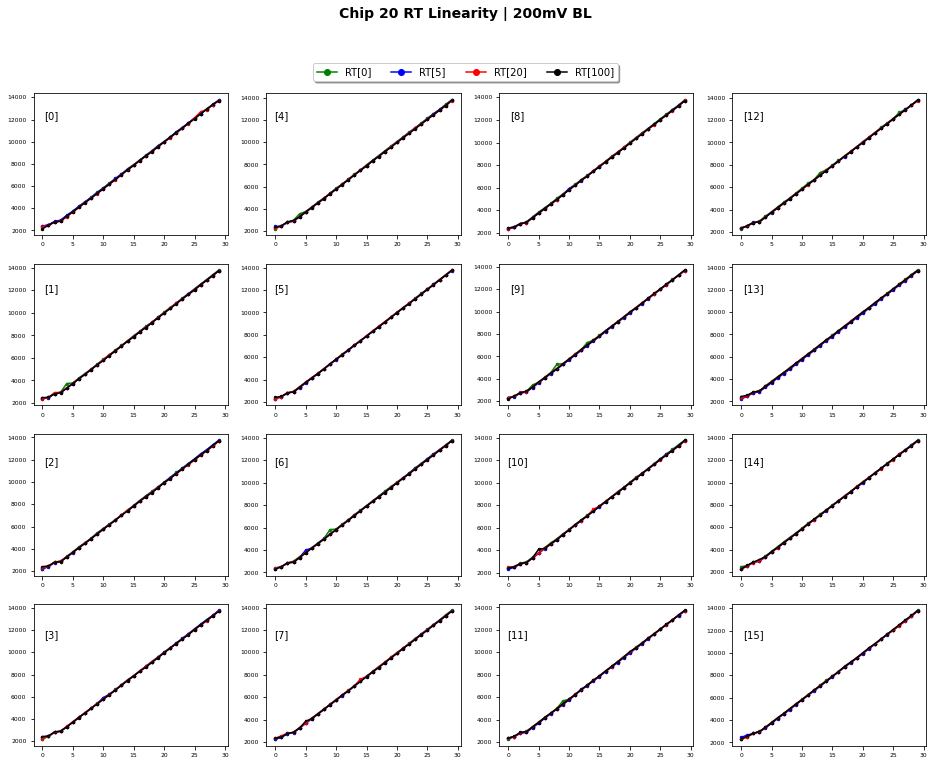

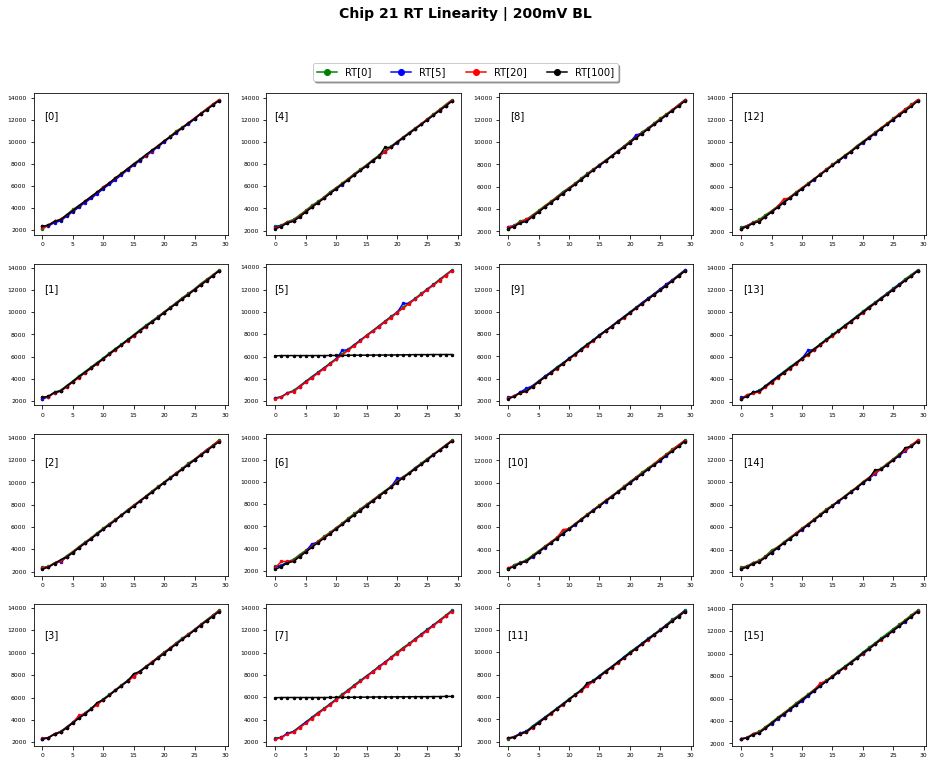

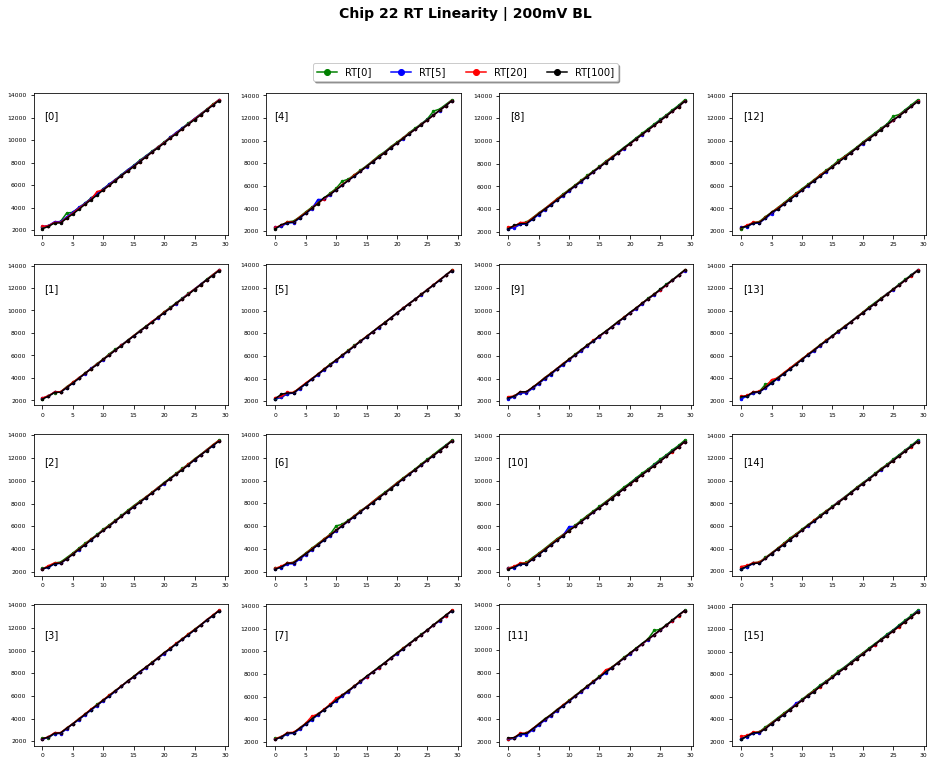

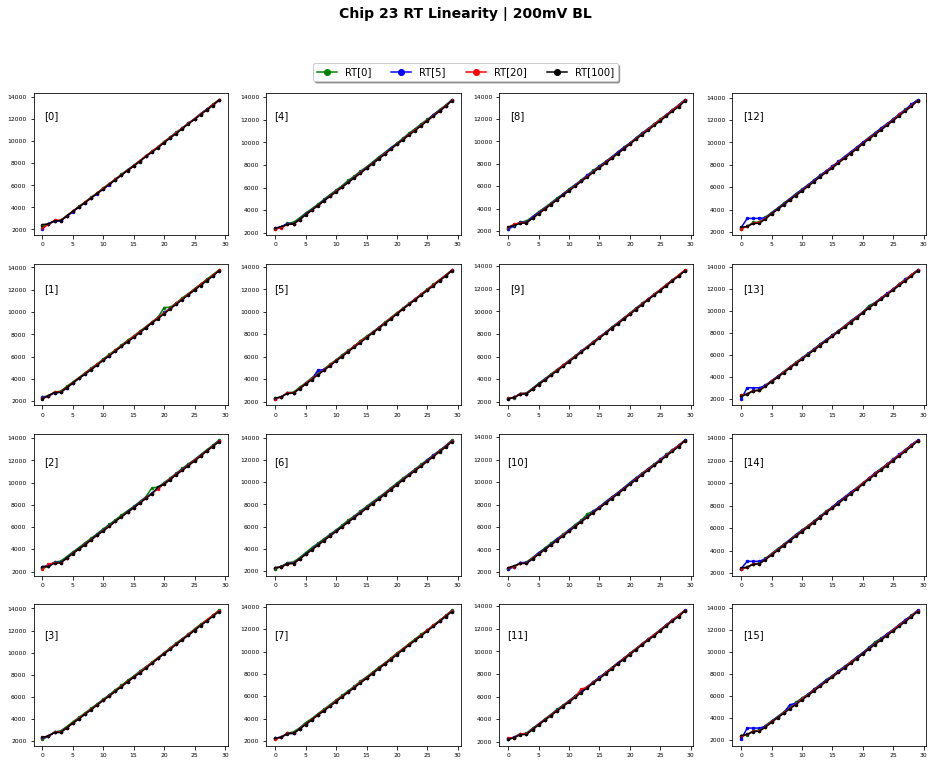

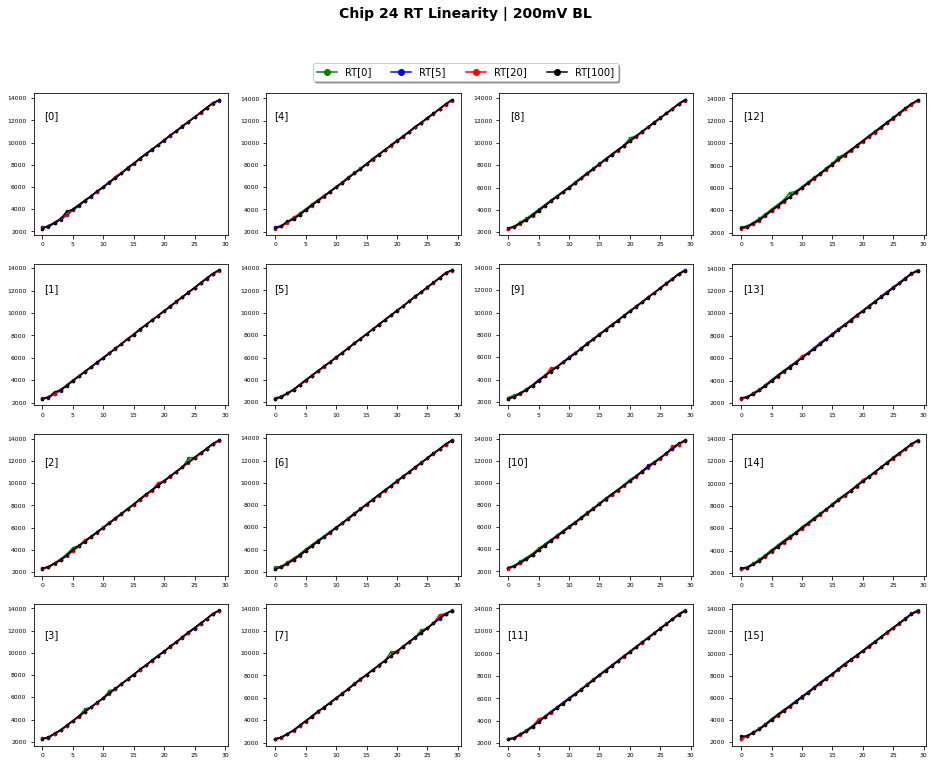

...

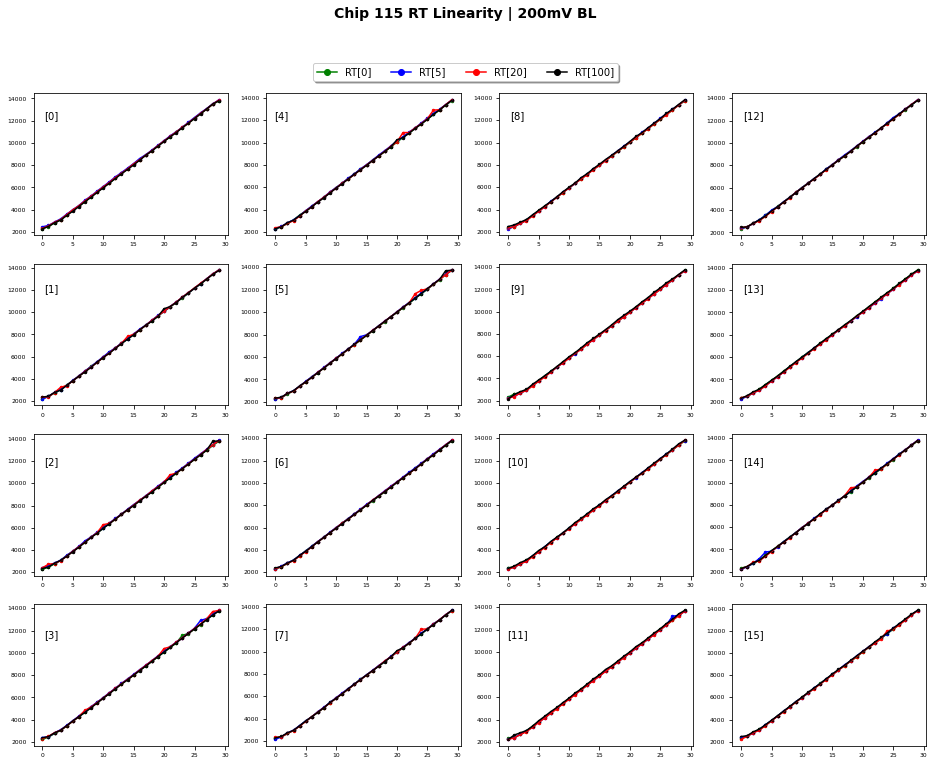

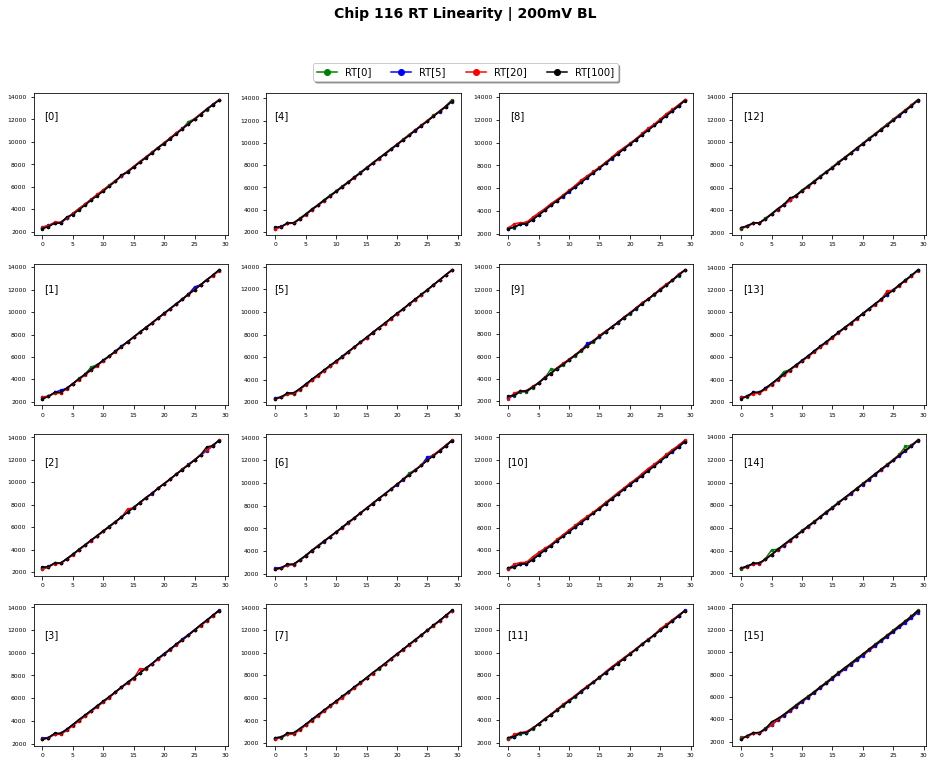

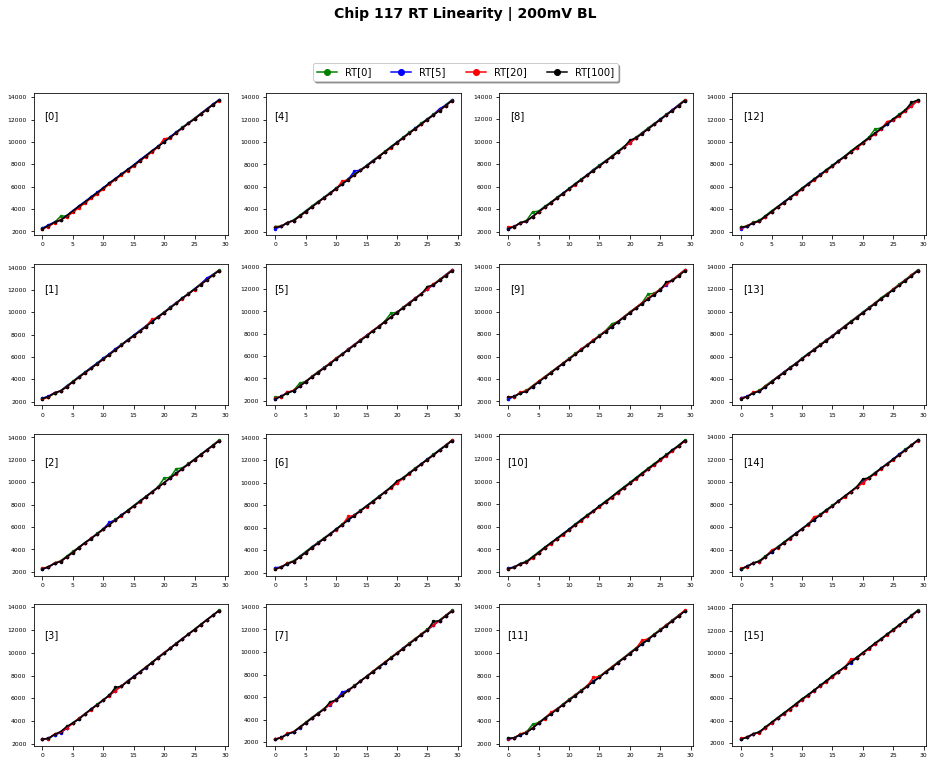

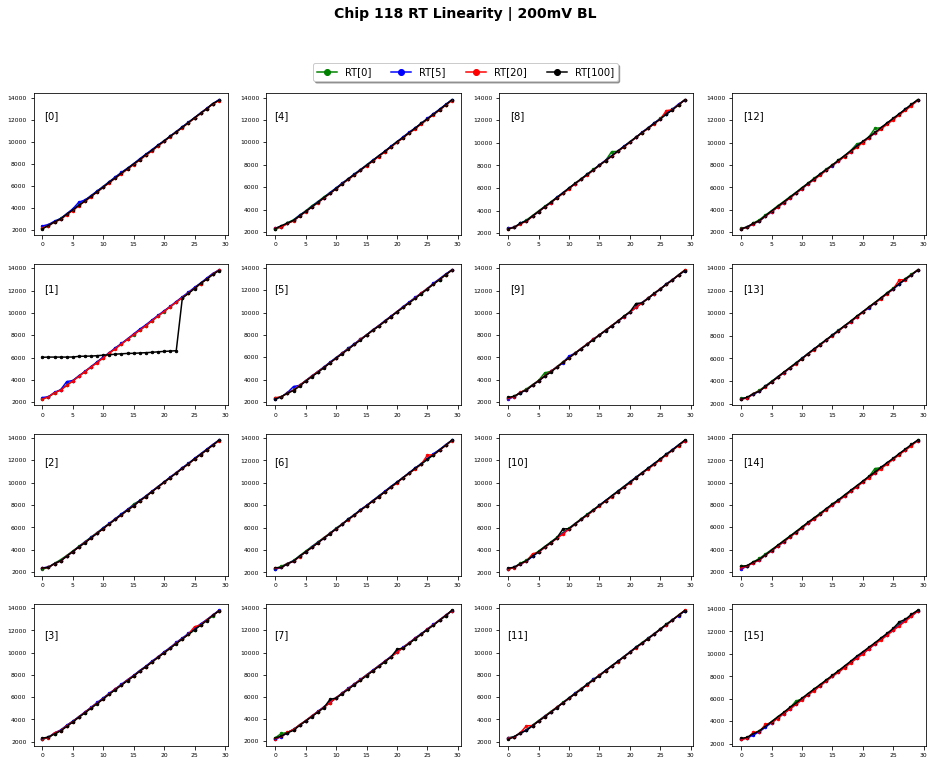

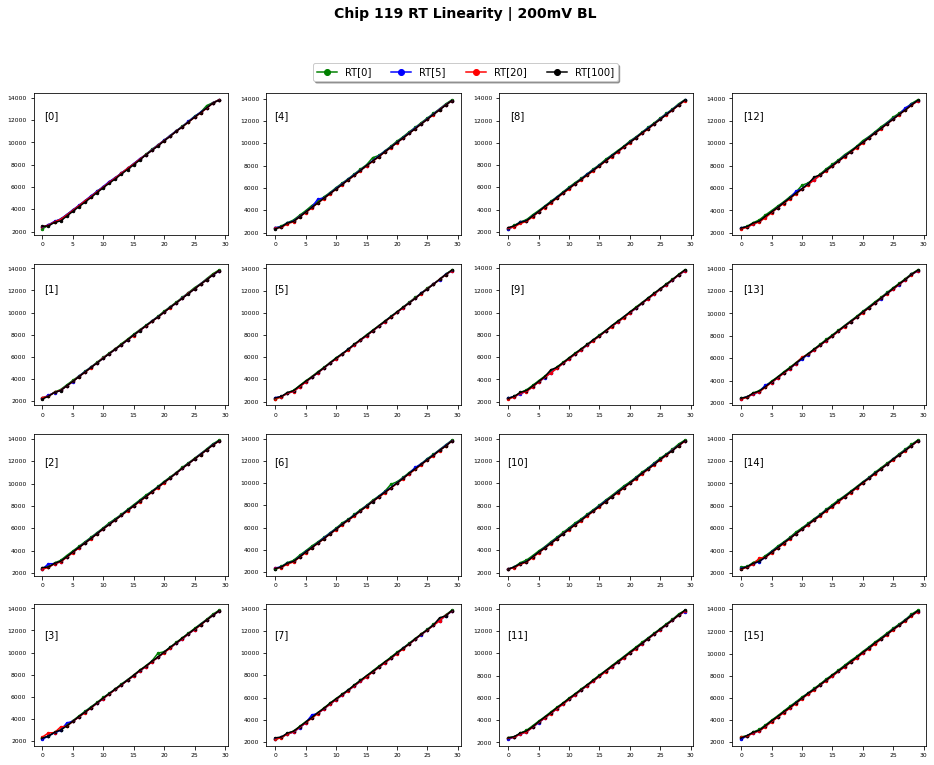

done


In [4]:
# Plot and save all 100 chips

IN = [i for i in range(len(chips))]

for i in IN:
    Title = 'Chip ' +  str(i+20)  + ' RT Linearity | 200mV BL'
    
    CI = int(i) # Specify chip number for the code (0 - number of chips)
    path = '../../Cryocycled Chip Catalog/' + str(i+20) + '/' + str(i+20) + ' RT Linearity.png'
    path_cache = '../../Cryocycled Chip Catalog Photo Cache/' + str(i+20) + ' RT Linearity.png'
    LinearityPlot16(Title,CI,path,path_cache)
    
print('done')

In [3]:
# Plot Individual channel of an ASIC

def LinearityPlot_single(Title,ASIC,ch):
    
    fig, ax = plt.subplots()
    ax.set_title(Title)
    ax.set_xlabel('Subrun Number', loc = 'right')
    ax.scatter(SR[ASIC][ch], PA[ASIC][ch], color = 'red')
    ax.plot(SR[ASIC][ch], PA[ASIC][ch], color = 'black')
    
    return

In [11]:
#%matplotlib

ASIC = int(10) # Specify chip number for the code (20 + this number)
ch = int(4)   # Specify channel number

Title = 'Chip ' +  str(ASIC+20)  + ' Channel ' + str(ch) + ' Linearity CT[5] | 200mV Baseline'

LinearityPlot_single(Title,ASIC,ch)

Using matplotlib backend: Qt5Agg
